In [1]:
import starry
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import pymc3.math as pmm
import pymc3_ext as pmx
import exoplanet
from starry_process import StarryProcess, MCMCInterface
from starry_process.math import cho_factor, cho_solve
import starry_process 
import theano
theano.config.gcc__cxxflags += " -fexceptions"
theano.config.on_opt_error = "raise"
theano.tensor.opt.constant_folding
theano.graph.opt.EquilibriumOptimizer
import aesara_theano_fallback.tensor as tt
from theano.tensor.slinalg import cholesky
from corner import corner
import arviz as az
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from tqdm import tqdm
from theano.tensor.random.utils import RandomStream
import scipy.linalg as sl
import scipy.stats as ss
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import lightkurve as lk
import exoplanet as xo
import random
import emcee

starry.config.lazy = True
starry.config.quiet = True
np.random.seed(1)

import warnings

# Ignore all warnings (not recommended, might hide other important warnings)
warnings.filterwarnings("ignore")

# Ignore specific warning by type
warnings.filterwarnings("ignore", message="Cannot construct a scalar test value from a test value with no size")

# Set logging level to ignore these warnings (recommended)
import logging
logger = logging.getLogger("theano.tensor.opt")
logger.setLevel(logging.ERROR)


WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'
The version of PyMC you are using is very outdated.

Please upgrade to the latest version of PyMC https://www.pymc.io/projects/docs/en/stable/installation.html

Also notice that PyMC3 has been renamed to PyMC.
/Users/sabina/miniconda3/envs/starry-env/lib/python3.9/site-packages/lightkurve/config/__init__.py:119: UserWarning: The default Lightkurve cache directory, used by download(), etc., has been moved to /Users/sabina/.lightkurve/cache. Please move all the files in the legacy directory /Users/sabina/.lightkurve-cache to the new location and remove the legacy directory. Refer to https://docs.lightkurve.org/reference/config.html#default-cache-directory-migration for more information.
  warnings.warn(


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(1, '/Users/sabina/Desktop/GitHub/starry-project/scripts')

from starry_starry_process import StarryStarryProcess

In [4]:
def gp_model(ts, fluxes, sigma_fluxes, params):
    # Helper function to instantiate parameters
    def parameter(name):
        param = params[name]
        if param.get("free", False):
            args = param.get("args", [])
            kwargs = param.get("kwargs", {})
            testval = param.get("testval", param["truth"])
            return param["dist"](name, *args, testval=testval, **kwargs)
            
        else:
            return param["truth"]
    
    starry.config.lazy = True
        
    with pm.Model() as model:

        prot = parameter('star.prot')

        porb = parameter('planet.porb')
        t0 = parameter('planet.t0')
        rp = parameter('planet.r')
        planet_inc = parameter('planet.inc')
        mp = parameter('planet.m')
        ecc = parameter('planet.ecc')
        Omega = parameter('planet.Omega')
        w = parameter('planet.w')

        map_model = starry.Map(ydeg=15, udeg=2)

        stellar_inc, stellar_obl = Stellar_Ori()
        # map_model.inc = parameter('star.inc')
        # map_model.obl = parameter('star.obl')
        map_model.inc = stellar_inc
        map_model.obl = stellar_obl
        
        map_model[1] = parameter('star.u1')
        map_model[2] = parameter('star.u2')
        
        pri_model = starry.Primary(map_model, 
            r=parameter('star.r'), 
            m=parameter('star.m'), 
            prot=prot)

        sec_model = starry.kepler.Secondary(starry.Map(0,0), 
            t0=t0, 
            r=rp, 
            m=mp, 
            porb=porb, 
            ecc=ecc, 
            Omega=Omega, 
            inc=planet_inc,
            w=w)
    
        sys_model = starry.System(pri_model, sec_model)

        sp_model = StarryProcess(
            a = parameter("gp.a"),
            b = parameter("gp.b"),
            c = parameter("gp.c"),
            r = parameter("gp.r"),
            n = parameter("gp.n"),
            ydeg = 15,
        )
        
        K00 = 0.
        K01 = 10.
        K10 = np.log(0.5)
        K11 = 10.
        alpha = tt.exp(K00 + (K10 - K00) * sp_model.a)
        beta = tt.exp(K10 + (K11 - K10) * sp_model.b) 

        pm.Deterministic('sp.mu', alpha / (alpha + beta) * 180 / np.pi)
        pm.Deterministic('sp.var', alpha * beta / (tt.square(alpha + beta) * (alpha + beta + 1)) * 180 / np.pi)

        for i in range(len(ts)):
            ssp_model = StarryStarryProcess(sys_model, sp_model)
            ssp_model.compute(ts[i], fluxes[i], sigma_fluxes[i])

            pm.Deterministic(f'flux_model_{i}', tt.dot(ssp_model.design_matrix, ssp_model.sample_ylm_conditional(ts[i], fluxes[i], sigma_fluxes[i])[0]))
            pm.Deterministic(f'max_map_{i}', ssp_model._a)
            
            pm.Potential(f'marginal_likelihood_{i}', ssp_model.marginal_likelihood(ts[i], fluxes[i], sigma_flux=sigma_fluxes[i]))


    return model

In [5]:
def bin_out_of_transit(t, flux, err, params, dt=0.06, binsize=30):
    """
    Bin the out of transit points to speed things up.
    
    """
    # Find in-transit and out-of-transit points
    idx = np.zeros(len(t), dtype=bool)
    ntransits = int(np.ceil(t[-1] / params["planet.porb"]["truth"]))
    for n in range(ntransits):
        t0 = params["planet.t0"]["truth"] + n * params["planet.porb"]["truth"]
        idx |= ((t > t0 - dt) & (t < t0 + dt))
    t_in = t[idx]
    f_in = flux[idx]
    t_out = t[~idx]
    f_out = flux[~idx]

    # Make the size of the out-of-transit array divisible by binsize
    # so we can bin by simple array reshaping
    trim = len(t_out) % binsize
    t_out = t_out[:-trim]
    f_out = f_out[:-trim]

    # We need to be careful not to bin *across* the transit, so
    # let's NaN-out points right _before_ each transit
    f_out[np.where(np.diff(t_out) > 0.1)] = np.nan

    # Bin the out-of-transit data
    t_out = t_out.reshape(-1, binsize).mean(axis=1)
    f_out = f_out.reshape(-1, binsize).mean(axis=1)

    # Remove any nans (the averages *across* transits)
    idx = np.isnan(f_out)
    t_out = t_out[~idx]
    f_out = f_out[~idx]

    # Error arrays
    e_in = err[0] * np.ones_like(t_in)
    e_out = (err[0] / np.sqrt(binsize)) * np.ones_like(t_out)

    # Sort and merge the arrays
    t_ = np.concatenate((t_in, t_out))
    f_ = np.concatenate((f_in, f_out))
    e_ = np.concatenate((e_in, e_out))
    idx = np.argsort(t_)
    t_ = t_[idx]
    flux_ = f_[idx]
    err_ = e_[idx]

    return t_, flux_, err_

## Get a light curve

<Axes: xlabel='Time - 2457000 [BTJD days]', ylabel='Flux'>

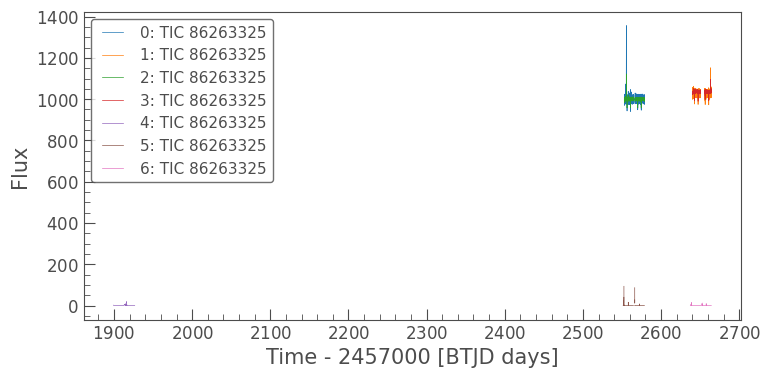

In [6]:
search_result = lk.search_lightcurve('TOI 3884')
lc_collection = search_result.download_all()
lc_collection.plot()

In [7]:
lc_collection

LightCurveCollection of 7 objects:
    0: <TessLightCurve LABEL="TIC 86263325" SECTOR=46 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    1: <TessLightCurve LABEL="TIC 86263325" SECTOR=49 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    2: <TessLightCurve LABEL="TIC 86263325" SECTOR=46 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    3: <TessLightCurve LABEL="TIC 86263325" SECTOR=49 AUTHOR=SPOC FLUX_ORIGIN=pdcsap_flux>
    4: <TessLightCurve LABEL="TIC 86263325" SECTOR=22 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    5: <TessLightCurve LABEL="TIC 86263325" SECTOR=46 AUTHOR=QLP FLUX_ORIGIN=sap_flux>
    6: <TessLightCurve LABEL="TIC 86263325" SECTOR=49 AUTHOR=QLP FLUX_ORIGIN=sap_flux>

In [8]:
lc_collection[0].time.value

array([2551.56457604, 2551.56596505, 2551.56735406, ..., 2578.69916336,
       2578.70055237, 2578.70194138])

In [9]:
lc_collection[1].time.value

array([2637.47827863, 2637.47966756, 2637.48105648, ..., 2664.31742913,
       2664.31881799, 2664.32020686])

In [10]:
lc_collection[2].time.value

array([2551.59235621, 2551.63402647, 2551.64097151, ..., 2578.68527324,
       2578.6922183 , 2578.69916336])

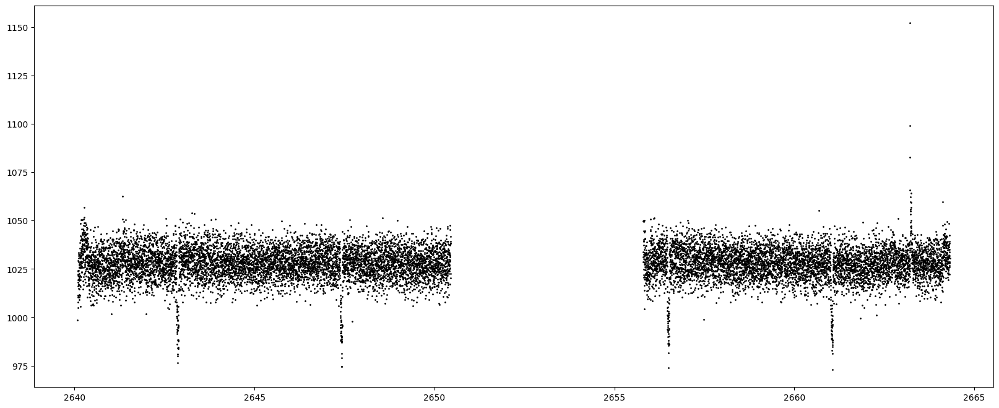

In [11]:
plt.figure(figsize=(20, 8))
plt.plot(lc_collection[1].time.value, lc_collection[1].flux, "k.", ms=2)
# plt.xlim(1335,1335.5)
plt.show()

In [12]:
lc1 = lc_collection[0].remove_nans()
lc1 = lc1[lc1.quality == 0]

lc4 = lc_collection[1].remove_nans()
lc4 = lc4[lc4.quality == 0]

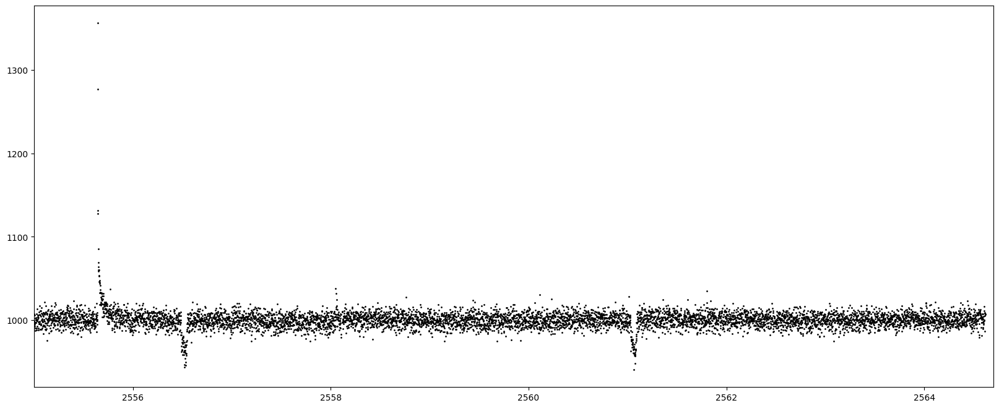

In [13]:
plt.figure(figsize=(20, 8))
plt.plot(lc1.time.value, lc1.flux, "k.", ms=2)
plt.xlim(2555,2564.7)
plt.show()

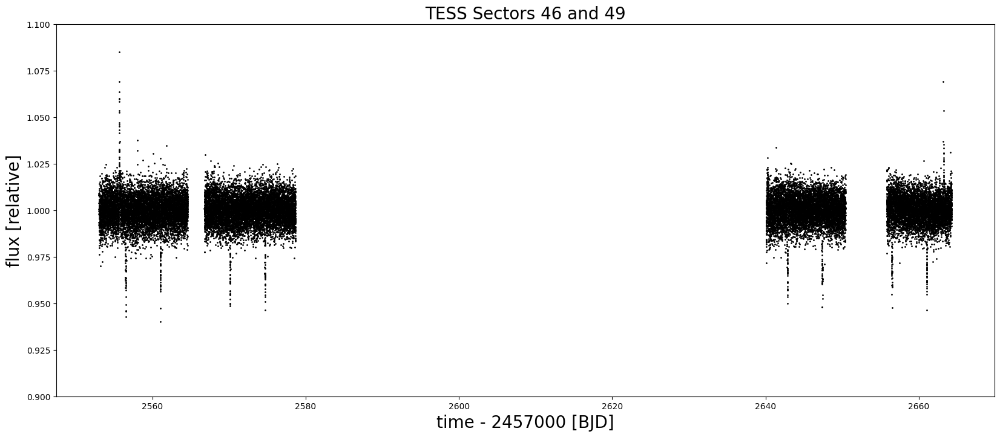

In [14]:
plt.figure(figsize=(20, 8))
plt.plot(lc1.time.value, lc1.flux / np.mean(lc1.flux), "k.", ms=2)
plt.ylim(0.9,1.1)
plt.ylabel("Relative Flux", fontsize=20)
plt.xlabel("Time - 2457000 [BJD]", fontsize=20)
# plt.legend(fontsize=16)
plt.plot(lc4.time.value, lc4.flux / np.mean(lc4.flux), "k.", ms=2)
plt.ylim(0.9,1.1)
plt.ylabel("flux [relative]", fontsize=20)
plt.xlabel("time - 2457000 [BJD]", fontsize=20)
# plt.legend(fontsize=16)
plt.title("TESS Sectors 46 and 49", fontsize=20)
# plt.show()
plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-lc.pdf", bbox_inches="tight", dpi=300)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


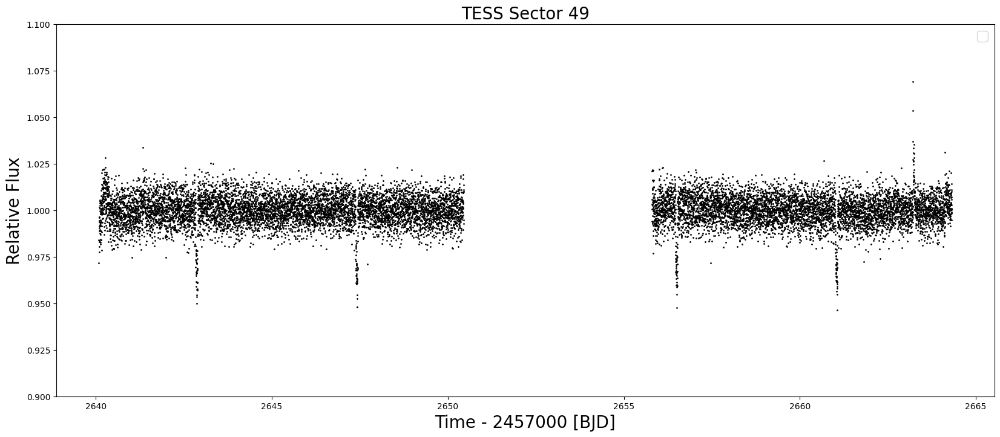

<Figure size 640x480 with 0 Axes>

In [15]:
plt.figure(figsize=(20, 8))
plt.plot(lc4.time.value, lc4.flux / np.mean(lc4.flux), "k.", ms=2)
plt.ylim(0.9,1.1)
plt.ylabel("Relative Flux", fontsize=20)
plt.xlabel("Time - 2457000 [BJD]", fontsize=20)
plt.legend(fontsize=16)
plt.title("TESS Sector 49", fontsize=20)
plt.show()
plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-sector49lc.pdf", bbox_inches="tight", dpi=300)

In [16]:
np.where(lc1.time.value > 2564.7)

(array([ 8336,  8337,  8338, ..., 16911, 16912, 16913]),)

In [17]:
chunk_times = []
chunk_fluxes = []
chunk_sigmas = []
chunk_times.append(lc1.time.value[:8336])
chunk_fluxes.append(np.ascontiguousarray(lc1.flux, dtype=np.float64)[:8336] / np.array(np.mean(lc1.flux)))
chunk_sigmas.append(np.ascontiguousarray(lc1.flux_err, dtype=np.float64)[:8336] / np.array(np.mean(lc1.flux)))

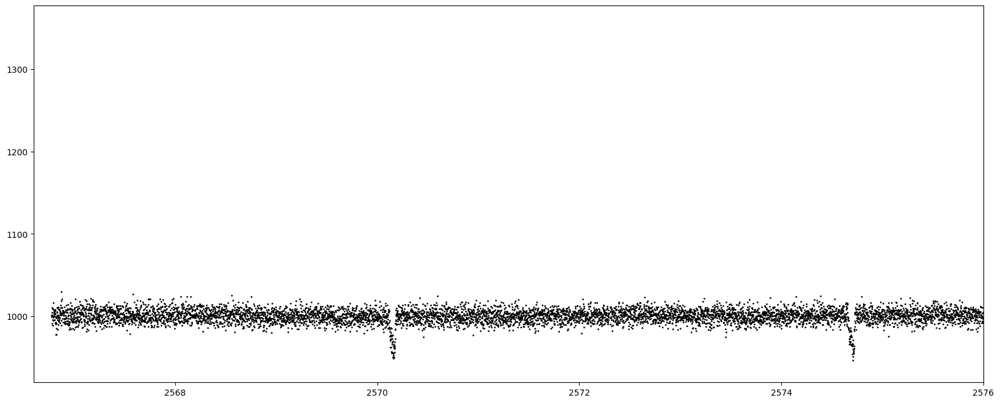

In [18]:
plt.figure(figsize=(20, 8))
plt.plot(lc1.time.value, lc1.flux, "k.", ms=2)
plt.xlim(2566.6,2576)
plt.show()

In [19]:
np.where(lc1.time.value>2566.6)

(array([ 8336,  8337,  8338, ..., 16911, 16912, 16913]),)

In [20]:
chunk_times.append(lc1.time.value[8336:])
chunk_fluxes.append(np.ascontiguousarray(lc1.flux, dtype=np.float64)[8336:] / np.array(np.mean(lc1.flux)))
chunk_sigmas.append(np.ascontiguousarray(lc1.flux_err, dtype=np.float64)[8336:] / np.array(np.mean(lc1.flux)))

In [21]:
total_t = np.concatenate((lc1.time.value, lc4.time.value))
total_flux = np.concatenate((np.ascontiguousarray(lc1.flux, dtype=np.float64)/ np.array(np.mean(lc1.flux)), np.ascontiguousarray(lc4.flux, dtype=np.float64)/ np.array(np.mean(lc4.flux))))
total_sigma = np.concatenate((np.ascontiguousarray(lc1.flux_err, dtype=np.float64)/ np.array(np.mean(lc1.flux)), np.ascontiguousarray(lc4.flux_err, dtype=np.float64)/ np.array(np.mean(lc4.flux))))

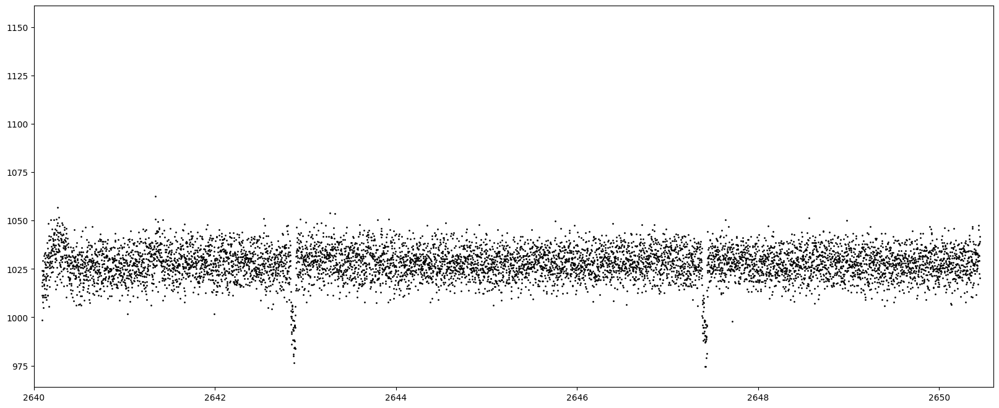

In [22]:
plt.figure(figsize=(20, 8))
plt.plot(lc_collection[1].time.value, lc_collection[1].flux, "k.", ms=2)
plt.xlim(2640,2650.6)
plt.show()

In [23]:
np.where(lc4.time.value>2650.6)

(array([ 7454,  7455,  7456, ..., 13578, 13579, 13580]),)

In [24]:
chunk_times.append(lc4.time.value[:7454])
chunk_fluxes.append(np.ascontiguousarray(lc4.flux, dtype=np.float64)[:7454] / np.array(np.mean(lc4.flux)))
chunk_sigmas.append(np.ascontiguousarray(lc4.flux_err, dtype=np.float64)[:7454] / np.array(np.mean(lc4.flux)))

chunk_times.append(lc4.time.value[7454:])
chunk_fluxes.append(np.ascontiguousarray(lc4.flux, dtype=np.float64)[7454:] / np.array(np.mean(lc4.flux)))
chunk_sigmas.append(np.ascontiguousarray(lc4.flux_err, dtype=np.float64)[7454:] / np.array(np.mean(lc4.flux)))

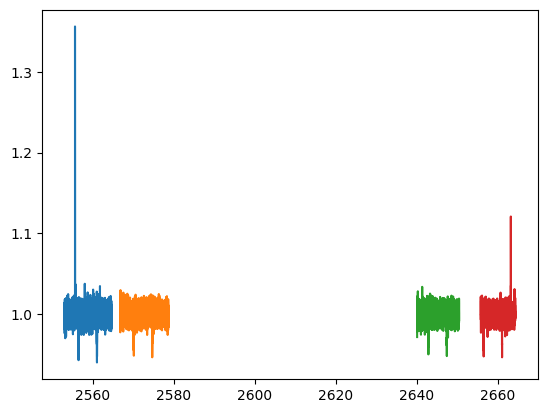

In [25]:
for i in range(len(chunk_times)):
    plt.plot(chunk_times[i], chunk_fluxes[i])

In [26]:
def remove_flares(t, flux, flux_err, window_size=100, sigma=1e-4):
    t_clean = []
    flux_clean = []
    flux_err_clean = []

    for i in range(len(t)):
        start = max(0, i - window_size // 2)
        end = min(len(t), i + window_size // 2)

        mean = np.mean(flux[start:end])
        std = np.std(flux[start:end])

        threshold = 1.025 #mean + sigma * std
        # print(threshold)

        if flux[i] < threshold:
            t_clean.append(t[i])
            flux_clean.append(flux[i])
            flux_err_clean.append(flux_err[i])

    t_clean = np.array(t_clean)
    flux_clean = np.array(flux_clean)
    flux_err_clean = np.array(flux_err_clean)

    return t_clean, flux_clean, flux_err_clean

t_clean, flux_clean, flux_err_clean = remove_flares(chunk_times[3], chunk_fluxes[3], chunk_sigmas[3])

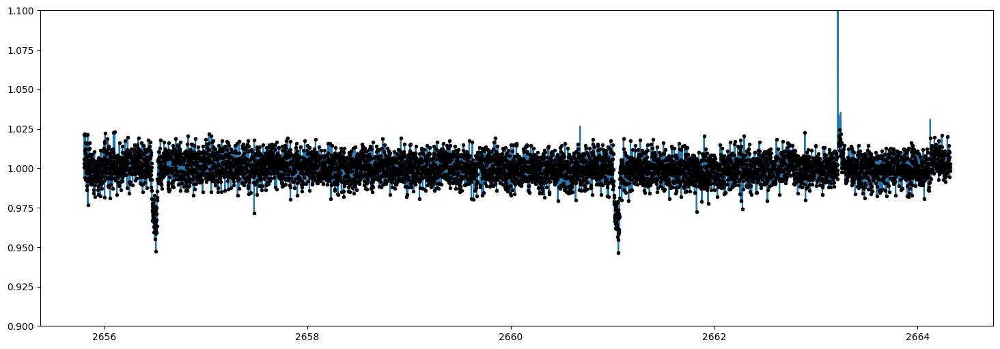

In [27]:
plt.figure(figsize=(18,6))
plt.plot(chunk_times[3], chunk_fluxes[3])
plt.plot(t_clean, flux_clean, 'k.')
# plt.xlim(2040,2042)
plt.ylim(0.9,1.1)
plt.show()

In [28]:
for i in range(len(chunk_times)):
    chunk_times[i], chunk_fluxes[i], chunk_sigmas[i] = remove_flares(chunk_times[i], chunk_fluxes[i], chunk_sigmas[i])

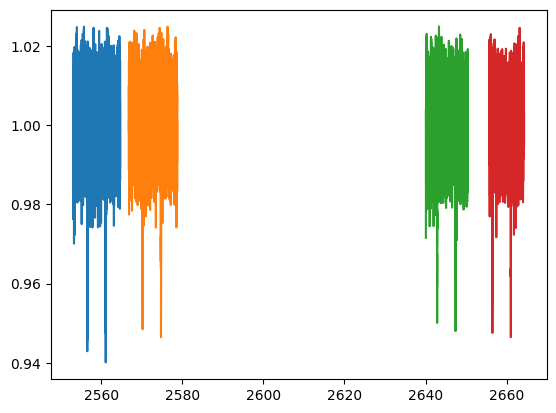

In [29]:
for i in range(len(chunk_times)):
    plt.plot(chunk_times[i], chunk_fluxes[i])

In [30]:
def Inclination(name, testval=30):
    """
    An isotropic distribution for inclination angles (in degrees).
    
    """
    def logp(x):
        return tt.log(np.pi / 180 * tt.sin(x * np.pi / 180))

    def random(*args, **kwargs):
        return tt.arccos(pm.Uniform.dist(0, 1).random(*args, **kwargs)) * 180 / np.pi

    return pm.DensityDist(
        name,
        logp,
        random=random,
        initval=testval,
    )

def Angle(*args, **kwargs):
    """
    A uniform distribution for angles in [-180, 180).
    
    """
    if kwargs.get("testval", None) is not None:
        kwargs["testval"] *= np.pi / 180
    return 180 / np.pi * pmx.Angle(*args, **kwargs)

def Planet_Inc(name, *args, **kwargs):
    bmax = params[name].get('bmax')
    b = pm.Uniform('b', -bmax, bmax)
    planet_inc = pm.Deterministic(name, 180.0/np.pi*np.arccos(b))
    
    return planet_inc

def Planet_w(name, *args, **kwargs):
    w_x = pm.Normal('w_x', mu=0, sigma=1, testval=1)
    w_y = pm.Normal('w_y', mu=0, sigma=1, testval=1)
    planet_w = pm.Deterministic(name, 180.0/np.pi*tt.arctan2(w_y, w_x))
    
    return planet_w

def xyz_transform(x_, y_, z_):
    x = x_
    y = (np.sqrt(2)/2) * (z_ + y_)
    z = (np.sqrt(2)/2) * (z_ - y_)

    return x, y, z

def xyz_transform_back(x, y, z):
    x_ = x
    y_ = (np.sqrt(2)/2) * (y - z)
    z_ = (np.sqrt(2)/2) * (y + z)

    return x_, y_, z_

def Stellar_Ori():
    stellar_ori_x_ = pm.Normal('stellar_ori_x_', mu=0, sigma=1, testval=1)
    stellar_ori_y_ = pm.Normal('stellar_ori_y_', mu=0, sigma=1, testval=1)
    stellar_ori_z_ = pm.HalfNormal('stellar_ori_z_', sigma=1, testval=1)

    stellar_ori_x, stellar_ori_y, stellar_ori_z = xyz_transform(stellar_ori_x_, stellar_ori_y_, stellar_ori_z_)

    stellar_obl = pm.Deterministic('star.obl', 180.0/np.pi*tt.arctan2(stellar_ori_y, stellar_ori_x))
    stellar_inc = pm.Deterministic('star.inc', 180.0/np.pi*tt.arccos(stellar_ori_z / tt.sqrt(tt.square(stellar_ori_x) + tt.square(stellar_ori_y) + tt.square(stellar_ori_z))))
    
    return stellar_inc, stellar_obl
    # if "inc" in name:
    #     return stellar_inc
    
    # elif "obl" in name:
    #     return stellar_obl

def Period(name, *args, **kwargs):
    Ttotal = t[-1] - t[0]
    frac_bounds = params[name].get('frac_bounds')

    if kwargs.get("testval", None) is not None:
        trueval = kwargs["testval"]

    def logp(trueval, frac_bounds):
        return pm.Uniform(name+'logp',tt.log(trueval) + np.log1p(-frac_bounds), tt.log(trueval) + np.log1p(frac_bounds))

    period = pm.Deterministic(name, tt.exp(logp(trueval, frac_bounds)))

    return period

def Logarithmic(name, *args, **kwargs):
    if kwargs.get("testval", None) is not None:
        trueval = kwargs["testval"]
    log_rp = pm.Uniform(name+'log', tt.log(trueval/2), tt.log(2*trueval))
    rp = pm.Deterministic(name, tt.exp(log_rp))

    return rp

# Shorthand for the usual Uniform distribution
Uniform = pm.Uniform

In [31]:
mSun = 1.989e33 # grams
mJ = 1.898e30 
rJ = 6.99e6 # cm
rSun = 69.634e6

mTOI3884 = 0.2813 * mSun
mTOI3884b = 0.0519 * mJ # grams
rTOI3884 = 0.3043 * rSun 
rTOI3884b = 0.535 * rJ # cm

In [32]:
mTOI3884 / mSun

0.2813

In [33]:
# True parameters & priors
params = {
    "planet.inc": {"truth": 85.85844557321126, "dist": Planet_Inc},
    "planet.ecc": {"truth": 0.48181713192128145, "dist": Uniform, "args": [0.0, 1.]},
    "planet.Omega": {"truth": 0.0, "dist": Angle},
    "planet.porb": {"truth": 4.544592163539594, "dist": Period},
    "planet.t0": {"truth": 2556.516, "dist": Uniform, "args": [2556, 2557]},
    "planet.r": {"truth": 0.1746426230950171, "dist": Logarithmic},
    "planet.m": {"truth":  mTOI3884b / mTOI3884, "dist": Uniform, "args": [4e-5, 4e-4]},
    "planet.w": {"truth": 190, "dist": Planet_w},

    "star.inc": {"truth": 115.45005374162783, "dist": Stellar_Ori},
    "star.m": {"truth": 1, "dist": Uniform, "args": [0.1, 0.3]},
    "star.u1": {"truth": 0.2886379996338223, "dist": Uniform, "args": [0.0, 0.5]},
    "star.u2": {"truth": 0.08500237661869868, "dist": Uniform, "args": [0.0, 0.2]},
    "star.prot": {"truth": 18, "dist": Period},
    "star.obl": {"truth": 62.31482288062067, "dist": Stellar_Ori},
    "star.r": {"truth": 1, "dist": Uniform, "args": [0.1, 0.4]},

    "gp.r": {"truth": 50., "dist": Uniform, "args": [10.0, 60.0]},
    "gp.c": {"truth": 0.1, "dist": Uniform, "args": [0.1, 0.9]},
    "gp.n": {"truth": 1., "dist": Uniform, "args": [0., 10.]},
    "gp.mu": {"truth": 60., "dist": Uniform, "args": [0.0, 90.0]},
    "gp.sigma": {"truth": 5., "dist": Uniform, "args": [0.0, 20.]}
}

In [34]:
for i in range(len(chunk_times)):
    chunk_times[i], chunk_fluxes[i], chunk_sigmas[i] = bin_out_of_transit(chunk_times[i], chunk_fluxes[i], chunk_sigmas[i], params, dt=0.05, binsize=100)

In [35]:
t = np.concatenate(chunk_times)
flux_obs = np.concatenate(chunk_fluxes)
sigma_flux = np.concatenate(chunk_sigmas)

# Inference

In [36]:
# True parameters & priors
truths = {
    "planet.inc": 85.85844557321126,
    "planet.ecc": 0.48181713192128145, 
    "planet.Omega": 0.0,
    "planet.porb": 4.544592163539594,
    "planet.t0": 2556.516,
    "planet.r": 0.1746426230950171,
    "planet.m": mTOI3884b / mTOI3884, 
    "planet.w": 190,

    "star.inc": 115.45005374162783,
    "star.m": 1,
    "star.u1": 0.2886379996338223,
    "star.u2": 0.08500237661869868,
    "star.prot": 10, 
    "star.obl": 62.31482288062067, 
    "star.r": 1,

    "gp.r": 11.609196393800204, 
    "gp.c": 0.4132101747490784,
    "gp.n": 3.3160051258826533, 
    "gp.mu": 60.0, 
    "gp.sigma": 5.0, 
}

In [37]:
truths['planet.r'] = 6.43 * 0.009 / 0.302 # from Libby-Rogers

In [39]:
rho_toi3884 = 15.26
rho_sun = 1.41
sigma_rho_toi3884 = 2.04

In [40]:
def inv_logit(x, a, b):
    y = 1/(1 + np.exp(-x))
    return a + (b-a)*y

def logit(y, a, b):
    yy = (b-y)/(b-a)
    return np.log1p(-yy) -np.log(yy)

def log_jacobian_inv_logit(y, x, a, b):
    # dy/dx = 1/(1+exp(-x))^2 * exp(-x) = y^2 exp(-x)
    if x < 0:
        return np.log(b-a) + x - 2*np.log1p(np.exp(x))
    else:
        return np.log(b-a) - x - 2*np.log1p(np.exp(-x))

# Planetary inclination
# semi-major axis
a = (truths['star.m']*np.square(truths['planet.porb']/365.25))**(1/3) * 215.03 # Solar radii
# impact parameter
bmax = truths['star.r'] / a

def unpack_parameters(xs, return_logjac=False):
    logjac = 0.0

    impact_parameter_logit, eccentricity_logit, f_porb_logit, f_t0_logit, w_x, w_y, stellar_x_, stellar_y_, stellar_z__log, u1_logit, u2_logit, f_prot_logit, gp_r_logit, gp_c_logit, gp_n_logit, gp_mu_logit, gp_sigma_logit, stellar_mass_log, planet_radius_logit = xs

    impact_parameter = inv_logit(impact_parameter_logit, -bmax, bmax)
    if return_logjac:
        logjac += log_jacobian_inv_logit(impact_parameter, impact_parameter_logit, -bmax, bmax)

    eccentricity = inv_logit(eccentricity_logit, 0, 1)
    if return_logjac:
        logjac += log_jacobian_inv_logit(eccentricity, eccentricity_logit, 0, 1)

    f_porb = inv_logit(f_porb_logit, 0.99, 1.01)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_porb, f_porb_logit, 0.99, 1.01)

    porb = truths['planet.porb']*f_porb
    if return_logjac:
        logjac += np.log(truths['planet.porb'])

    f_t0 = inv_logit(f_t0_logit, 0.9, 1.1)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_t0, f_t0_logit, 0.9, 1.1)

    t0 = truths['planet.t0'] + truths['planet.porb']*(f_t0-1)
    if return_logjac:
        logjac += np.log(truths['planet.porb'])

    planet_radius_log = inv_logit(planet_radius_logit, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))
    if return_logjac:
        logjac += log_jacobian_inv_logit(planet_radius_log, planet_radius_logit, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))

    stellar_z_ = np.exp(stellar_z__log)
    if return_logjac:
        logjac += stellar_z__log
    
    stellar_mass = np.exp(stellar_mass_log)
    if return_logjac:
        logjac += stellar_mass_log

    u1 = inv_logit(u1_logit, 0, 0.5)
    if return_logjac:
        logjac += log_jacobian_inv_logit(u1, u1_logit, 0, 0.5)

    u2 = inv_logit(u2_logit, 0, 0.2)
    if return_logjac:
        logjac += log_jacobian_inv_logit(u2, u2_logit, 0, 0.2)

    f_prot = inv_logit(f_prot_logit, 0.2, 1.8)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_prot, f_prot_logit, 0.2, 1.8)

    prot = f_prot*truths['star.prot']
    if return_logjac:
        logjac += np.log(truths['star.prot'])

    gp_r = inv_logit(gp_r_logit, 10.0, 60.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_r, gp_r_logit, 10.0, 60.0)

    gp_c = inv_logit(gp_c_logit, 0.01, 0.9)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_c, gp_c_logit, 0.01, 0.9)

    gp_n = inv_logit(gp_n_logit, 0.1, 10.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_n, gp_n_logit, 0.1, 10.0)

    gp_mu = inv_logit(gp_mu_logit, 0.1, 80.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_mu, gp_mu_logit, 0.1, 80.0)

    gp_sigma = inv_logit(gp_sigma_logit, 0.1, 20.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_sigma, gp_sigma_logit, 0.1, 20.0)

    params = (impact_parameter, eccentricity, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log)
    if return_logjac:
        return params, logjac
    else:
        return params
    
def pack_parameters(pars):
    (impact_parameter, eccentricity, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log) = pars

    ip_logit = logit(impact_parameter, -bmax, bmax)
    e_logit = logit(eccentricity, 0, 1)
    f_porb_logit = logit(porb/truths['planet.porb'], 0.99, 1.01)
    planet_radius_logit = logit(planet_radius_log, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))
    f_t0_logit = logit((t0-truths['planet.t0'])/truths['planet.porb'] + 1, 0.9, 1.1)
    stellar_z__log = np.log(stellar_z_)
    stellar_mass_log = np.log(stellar_mass)
    u1_logit = logit(u1, 0, 0.5)
    u2_logit = logit(u2, 0, 0.2)
    f_prot_logit = logit(prot / truths['star.prot'], 0.2, 1.8)
    gp_r_logit = logit(gp_r, 10.0, 60.0)
    gp_c_logit = logit(gp_c, 0.01, 0.9)
    gp_n_logit = logit(gp_n, 0.1, 10.0)
    gp_mu_logit = logit(gp_mu, 0.1, 80.0)
    gp_sigma_logit = logit(gp_sigma, 0.1, 20.0)

    return (ip_logit, e_logit, f_porb_logit, f_t0_logit, w_x, w_y, stellar_x_, stellar_y_, stellar_z__log, u1_logit, u2_logit, f_prot_logit, gp_r_logit, gp_c_logit, gp_n_logit, gp_mu_logit, gp_sigma_logit, stellar_mass_log, planet_radius_logit)

def lprior(x):
    logp = 0.0

    (b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log), logjac = unpack_parameters(x, return_logjac=True)

    # Flat priors on b, e, porb, t0

    # Gaussian on w_x, w_y
    logp += -0.5*(w_x*w_x + w_y*w_y) - 2*np.log(np.sqrt(2*np.pi)) 

    # Gaussian on the xyz_
    logp += -0.5*(stellar_x_*stellar_x_ + stellar_y_*stellar_y_ + stellar_z_*stellar_z_) - 3*np.log(np.sqrt(2*np.pi))

    # Log-Normal on mass
    mu = np.log(rho_toi3884 / rho_sun)
    sigma = sigma_rho_toi3884 / rho_toi3884
    logp += -0.5 * ((np.log(stellar_mass) - mu) / sigma)**2 - np.log(sigma) - 0.5 * np.log(2 * np.pi) - np.log(stellar_mass)

    # Flat on u1, u2, prot, and all the gp parameters

    return logp + logjac    

In [41]:
npar = 19
packed_pars = np.random.randn(npar)
np.abs(packed_pars - pack_parameters(unpack_parameters(packed_pars, return_logjac=False)))

array([2.22044605e-16, 3.33066907e-16, 1.33226763e-14, 2.43804976e-13,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       5.55111512e-17, 1.66533454e-16, 2.22044605e-16, 4.44089210e-16,
       2.22044605e-16, 1.11022302e-16, 4.44089210e-16, 2.22044605e-16,
       1.11022302e-16, 0.00000000e+00, 1.38777878e-16])

In [42]:
def log_likelihood(x):
    """Calculate log likelihood"""
    
    (b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log) = unpack_parameters(x, return_logjac=False)
    try:
        return log_likelihood_fn(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log)
    except (np.linalg.LinAlgError, ValueError):
        return -np.inf

def log_likelihood_from_scalars(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log): 
    map_model = starry.Map(ydeg=15, udeg=2)

    stellar_ori_x, stellar_ori_y, stellar_ori_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
    
    map_model.inc = 180.0/np.pi*tt.arccos(stellar_ori_z / tt.sqrt(tt.square(stellar_ori_x) + tt.square(stellar_ori_y) + tt.square(stellar_ori_z)))
    map_model.obl = 180.0/np.pi*tt.arctan2(stellar_ori_y, stellar_ori_x)
    
    map_model[1] = u1
    map_model[2] = u2
    
    pri_model = starry.Primary(
        map_model,
        r=truths['star.r'],
        m=stellar_mass,
        prot=prot
    )
    
    sec_model = starry.kepler.Secondary(
        starry.Map(0,0),
        t0=t0,
        r=np.exp(planet_radius_log),
        m=truths['planet.m'],
        porb=porb,
        ecc=e,
        Omega=truths['planet.Omega'],
        inc=180.0/np.pi*tt.arccos(b),
        w=180.0/np.pi*tt.arctan2(w_y, w_x)
    )
    
    sys_model = starry.System(pri_model, sec_model)
    
    sp_model = StarryProcess(
        mu=gp_mu,
        sigma=gp_sigma,
        c=gp_c,
        r=gp_r,
        n=gp_n,
        ydeg=15
    )
    
    log_like = 0
    
    for i in range(len(chunk_times)):
        ssp_model = StarryStarryProcess(sys_model, sp_model)
        ssp_model.compute(chunk_times[i], chunk_fluxes[i], chunk_sigmas[i])
        
        log_like += ssp_model.marginal_likelihood(
            chunk_times[i], 
            chunk_fluxes[i], 
            sigma_flux=chunk_sigmas[i]
        )
        
    return log_like

b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log = [tt.dscalar() for _ in range(19)]
log_likelihood_fn = theano.function([b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log], log_likelihood_from_scalars(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log))

In [43]:
chains = np.load('chain7_toi3884_musigma_2000_mass_radius.npy')
betas = np.load('betas7_toi3884_musigma_2000_mass_radius.npy')

In [44]:
chains = chains[1000:]

In [46]:
emcee.autocorr.integrated_time(chains[-1])

AutocorrError: The chain is shorter than 50 times the integrated autocorrelation time for 19 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 0;
tau: [0.5384585  0.52903828 0.60079252 0.55596572 0.25785543 0.4157198
 0.38235658 0.34775532 0.44267437 0.38281534 0.3742298  0.39351043
 0.35436799 0.52294626 0.56768958 0.51050447 0.23791311 0.38356311
 0.56612857]

In [43]:
chains.shape

(1000, 8, 40, 19)

In [62]:
def calculate_vsini(stellar_mass,stellar_density, rotation_period):
    solar_radius_km = 695700.0      # Solar radius in km
    seconds_per_day = 86400.0       # Seconds in a day
    solar_density_cgs = 1.41        # Solar density in g/cm³
    
    stellar_radius = (stellar_mass / stellar_density) ** (1/3)
    
    stellar_density_cgs = stellar_density * solar_density_cgs
    
    stellar_radius_km = stellar_radius * solar_radius_km
    
    rotation_period_seconds = rotation_period * seconds_per_day
    
    velocity = 2 * np.pi * stellar_radius_km / rotation_period_seconds
    
    return velocity, stellar_density_cgs


In [63]:
calculate_vsini(0.298,10,10)

(1.5685326043238743, 14.1)

In [469]:
chains.shape

(1000, 8, 40, 19)

In [470]:
np.zeros((chains.shape[0], chains.shape[2], chains.shape[3])).shape

(1000, 40, 19)

In [64]:
def get_traces_from_file(chains):

    unpacked_transformed = np.zeros((chains.shape[0], chains.shape[2], chains.shape[3]))
    for i in range(chains.shape[0]):
        for j in range(chains.shape[2]):
            original_params = unpack_parameters(chains[i,0,j,:], False)
            
            b = original_params[0]
            w_x = original_params[4]
            w_y = original_params[5]
            stellar_x_ = original_params[6]
            stellar_y_ = original_params[7]
            stellar_z_ = original_params[8]
            
            planet_w = 180.0/np.pi*np.arctan2(w_y, w_x)
            planet_inc = 180.0/np.pi*np.arccos(b)
            stellar_x, stellar_y, stellar_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
            star_obl = 180.0/np.pi*np.arctan2(stellar_y, stellar_x)
            star_inc = 180.0/np.pi*np.arccos(stellar_z / np.sqrt(np.square(stellar_x) + np.square(stellar_y) + np.square(stellar_z)))

            vsini = calculate_vsini(0.298,original_params[17],original_params[11])[0]
            stellar_density = calculate_vsini(0.298,original_params[17],original_params[11])[1]
            
            unpacked_transformed[i,j,:] = np.array([
                planet_inc,           # transformed
                original_params[1],   # ecc
                original_params[2],   # porb
                original_params[3],   # t0
                planet_w,            # transformed
                star_inc,            # transformed
                star_obl,            # transformed
                original_params[9],   # u1
                original_params[10],  # u2
                original_params[11],  # prot
                original_params[12],  # gp_r
                original_params[13],  # gp_c
                original_params[14],  # gp_n
                original_params[15],  
                original_params[16],
                original_params[17],
                np.exp(original_params[18]),
                vsini,
                stellar_density
            ])
    labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
    fig, ax = plt.subplots(chains.shape[3], figsize=(8, 22), sharex=True)
    for j in range(chains.shape[3]):
        for k in range(chains.shape[2]):
            ax[j].plot(unpacked_transformed[:, k, j], "C0-", lw=1, alpha=0.3)
        ax[j].set_ylabel(labels[j])
    ax[-1].set_xlabel("iteration")
    fig.align_ylabels(ax)
    plt.show()
    
    return unpacked_transformed


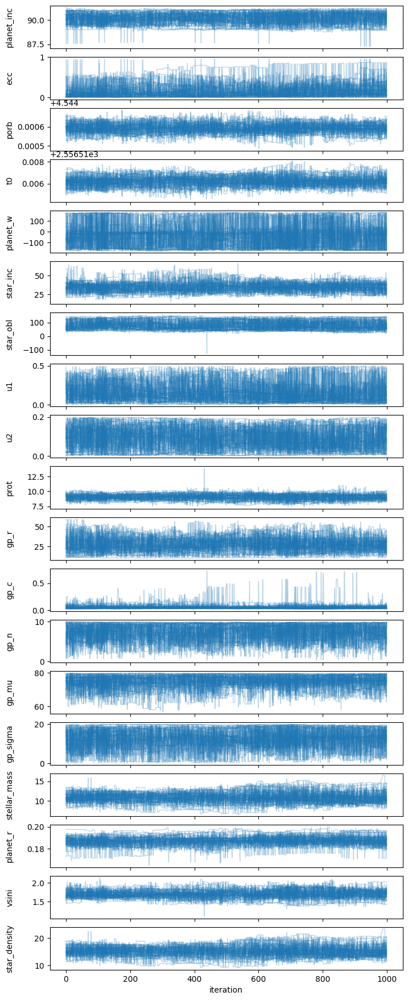

In [65]:
unpacked_transformed = get_traces_from_file(chains)

In [442]:
unpacked_transformed.shape

(1000, 40, 19)

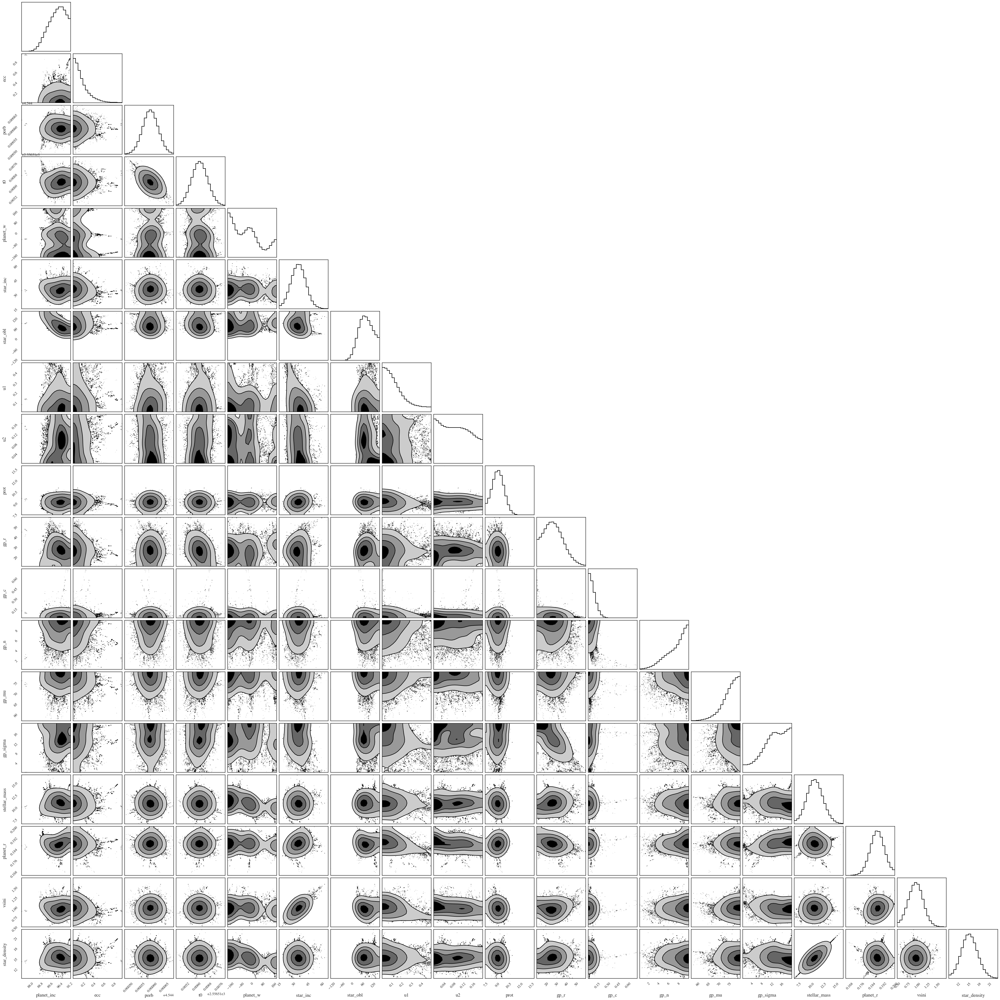

In [443]:
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
fig = corner(
    unpacked_transformed.reshape(1000*40, 19), labels=labels,
    color='k', 
    plot_datapoints=True,
    plot_density=False,
    fill_contours=True,
    smooth=2.,
    smooth1d=2.,
    hist_kwargs=dict(alpha=1)
);

In [ ]:
n_samples = 100
surface_maps = []
ylms = []
pixels = []

map = starry.Map(15, 2)
for i in range(n_samples):
    iternum = random.randint(0,chains.shape[0]-1)
    random_walker = random.randint(0,chains.shape[2]-1)

    b = unpack_parameters(chains[iternum,0,random_walker])[0]
    w_x = unpack_parameters(chains[iternum,0,random_walker])[4]
    w_y = unpack_parameters(chains[iternum,0,random_walker])[5]
    stellar_x_ = unpack_parameters(chains[iternum,0,random_walker])[6]
    stellar_y_ = unpack_parameters(chains[iternum,0,random_walker])[7]
    stellar_z_ = unpack_parameters(chains[iternum,0,random_walker])[8]
    
    planet_w = 180.0/np.pi*np.arctan2(w_y, w_x)
    planet_inc = 180.0/np.pi*np.arccos(b)
    stellar_x, stellar_y, stellar_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
    star_obl = 75#abs(180.0/np.pi*np.arctan2(stellar_y, stellar_x))
    star_inc = (180.0/np.pi*np.arccos(stellar_z / np.sqrt(np.square(stellar_x) + np.square(stellar_y) + np.square(stellar_z))))

    map.inc = star_inc
    map.obl = star_obl
    map[1] = unpack_parameters(chains[iternum,0,random_walker])[9]
    map[2] = unpack_parameters(chains[iternum,0,random_walker])[10]
    star = starry.Primary(map, r=truths["star.r"], m=unpack_parameters(chains[iternum,0,random_walker])[17], prot=unpack_parameters(chains[iternum,0,random_walker])[11]) 
    planet = starry.Secondary(
        starry.Map(0,0),
        inc=planet_inc,
        ecc=unpack_parameters(chains[iternum,0,random_walker])[1],
        Omega=truths["planet.Omega"],
        porb=unpack_parameters(chains[iternum,0,random_walker])[2],
        t0=unpack_parameters(chains[iternum,0,random_walker])[3],
        r=np.exp(unpack_parameters(chains[iternum,0,random_walker])[18]),
        m=truths["planet.m"],
        w=planet_w,
    )

    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)
    xo = xo.eval()[1]
    yo = yo.eval()[1]
    zo = zo.eval()[1]
    theta = (360 * t / params["star.prot"]["truth"]) % 360

    # *** Draw 1 sample from the GP
    sp = StarryProcess(
        mu=unpack_parameters(chains[iternum,0,random_walker])[15],
        sigma=unpack_parameters(chains[iternum,0,random_walker])[16],
        r=unpack_parameters(chains[iternum,0,random_walker])[12],
        c=unpack_parameters(chains[iternum,0,random_walker])[13],
        n=unpack_parameters(chains[iternum,0,random_walker])[14],
    )

    ssp=StarryStarryProcess(sys,sp)
    ssp.compute(t, flux_obs, sigma_flux)
    ylms.append(ssp.sample_ylm_conditional(t, flux_obs, sigma_flux).eval()[0])

    map[:, :] = ylms[i]
    lat, lon, Y2P, P2Y, Dx, Dy = map.get_pixel_transforms(oversample=4)
    pixels.append(Y2P.dot(ylms[i]))
    surface_maps.append(map)

    fig, ax = plt.subplots(1, figsize=(20, 8))
    if i<10:
        filename = 'map-samples00' + str(i)
    elif 10<=i<100:
        filename = 'map-samples0' + str(i)
    # elif 100<=i<1000:
    #     filename = 'map-samples' + str(i)

    map.show(ax=ax, file=filename, projection='moll', alpha=1)

In [170]:
# Calculate the average surface map
average_ylm = np.mean(ylms, axis=0)

# Calculate the variance of the pixels between the surface maps
variance_map = np.var(ylms, axis=0)

In [171]:
pixels = np.array(pixels)

In [172]:
ave_ps = np.mean(pixels, axis=0)

In [173]:
var_ps = np.var(pixels, axis=0)

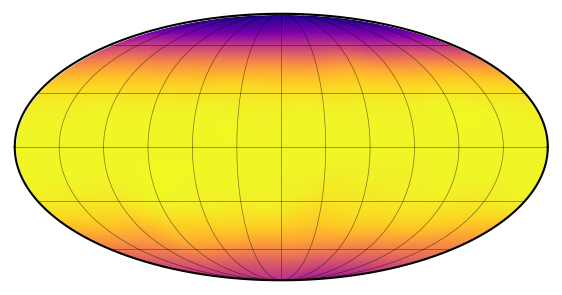

In [174]:
map[:,:] = average_ylm
map.show(projection='moll')

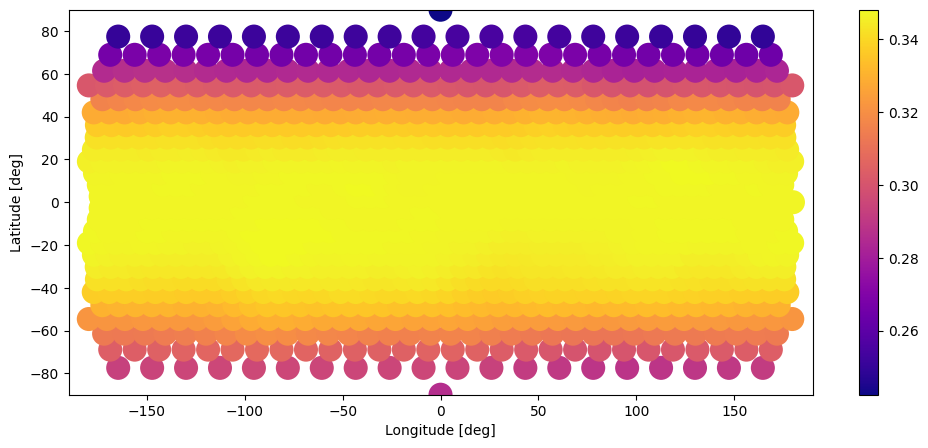

In [175]:
fig, ax = plt.subplots(1, figsize=(12, 5))
im = ax.scatter(lon, lat, s=300, c=ave_ps, alpha=1, ec="none", cmap="plasma")
plt.colorbar(im)
ax.set_xlim(-190, 190)
ax.set_ylim(-90, 90)
ax.set_xlabel("Longitude [deg]")
ax.set_ylabel("Latitude [deg]");

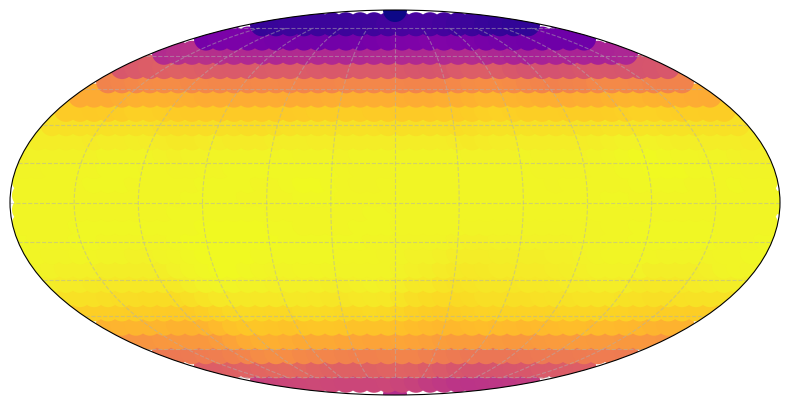

In [198]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='mollweide')

lon_rad = np.deg2rad(lon)

lat_rad = np.deg2rad(lat)

im = ax.scatter(lon_rad, lat_rad, s=300, c=ave_ps, alpha=1, ec="none", cmap="plasma")

ax.grid(True, alpha=0.5, linestyle='--')
ax.set_xticklabels([])
ax.set_yticklabels([])

# Show the plot
plt.tight_layout()
plt.show()

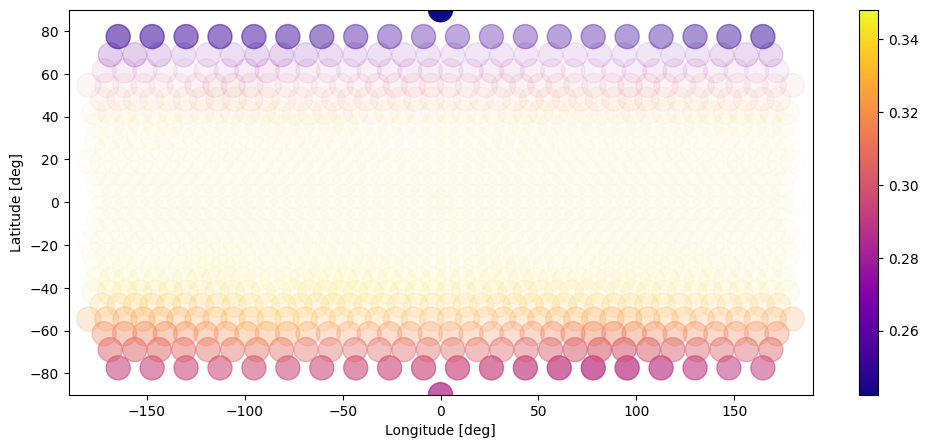

In [176]:
fig, ax = plt.subplots(1, figsize=(12, 5))
im = ax.scatter(lon, lat, s=300, c=ave_ps, alpha=var_ps / np.max(var_ps), cmap="plasma")
plt.colorbar(im)
ax.set_xlim(-190, 190)
ax.set_ylim(-90, 90)
ax.set_xlabel("Longitude [deg]")
ax.set_ylabel("Latitude [deg]");

In [177]:
pixel_precision = 1/var_ps
rescaled_pixel_precision = (pixel_precision - np.min(pixel_precision))/(np.max(pixel_precision) - np.min(pixel_precision))

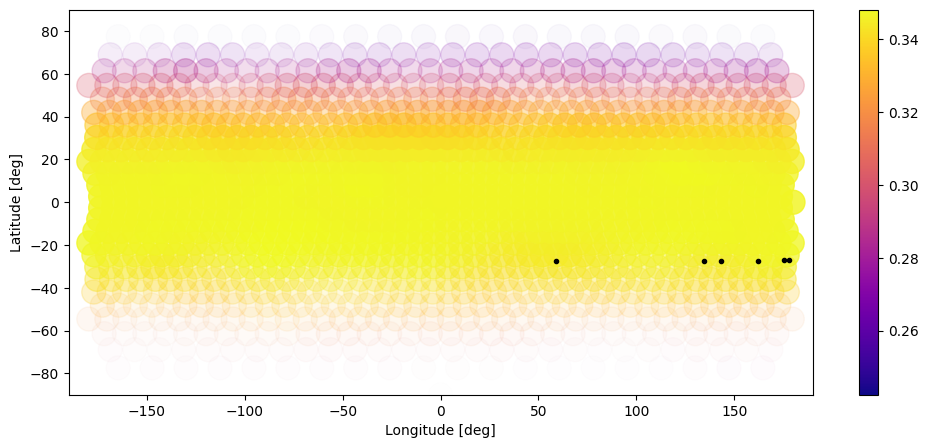

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 5))
idx = (zo > 0) & (xo ** 2 + yo ** 2 < 1)
lat1 = 180 / np.pi * np.arcsin(yo[idx])
lon1 = 180 / np.pi * np.arcsin(xo[idx] / np.sqrt(1 - yo[idx] ** 2)) - theta[idx]
lon1 = (lon1 + 180) % 360 - 180
mask = np.append(np.array(lon1[1:] > lon1[:-1], dtype=float), 0)
mask[mask == 1] = np.nan
im = ax.scatter(lon, lat, s=300, c=ave_ps, alpha=rescaled_pixel_precision, cmap="plasma")
ax.plot(lon1, lat1 + mask, "k.");
plt.colorbar(im)
ax.set_xlim(-190, 190)
ax.set_ylim(-90, 90)
ax.set_xlabel("Longitude [deg]")
ax.set_ylabel("Latitude [deg]");

In [203]:
t[0]

2553.091798167731

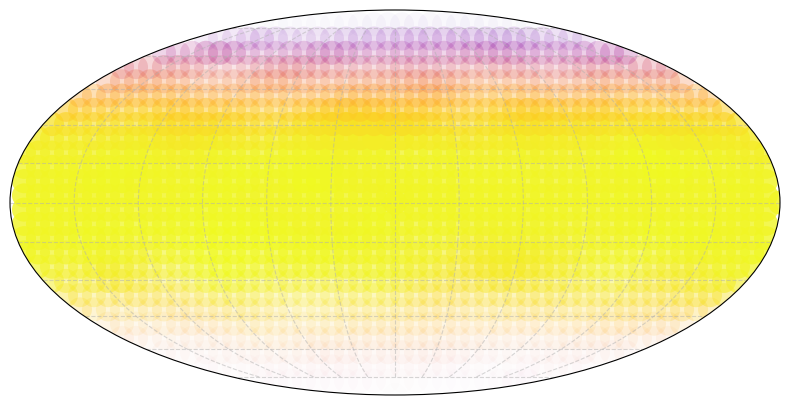

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='mollweide')

lon_rad = np.deg2rad(lon)

lat_rad = np.deg2rad(lat)

im = ax.scatter(lon_rad, lat_rad, s=300, c=ave_ps, alpha=rescaled_pixel_precision, ec="none", cmap="plasma")

ax.grid(True, alpha=0.5, linestyle='--')
ax.set_xticklabels([])
ax.set_yticklabels([])

# Show the plot
plt.tight_layout()
plt.show()

In [179]:
z_score = (ave_ps - np.mean(ave_ps)) / np.sqrt(var_ps)

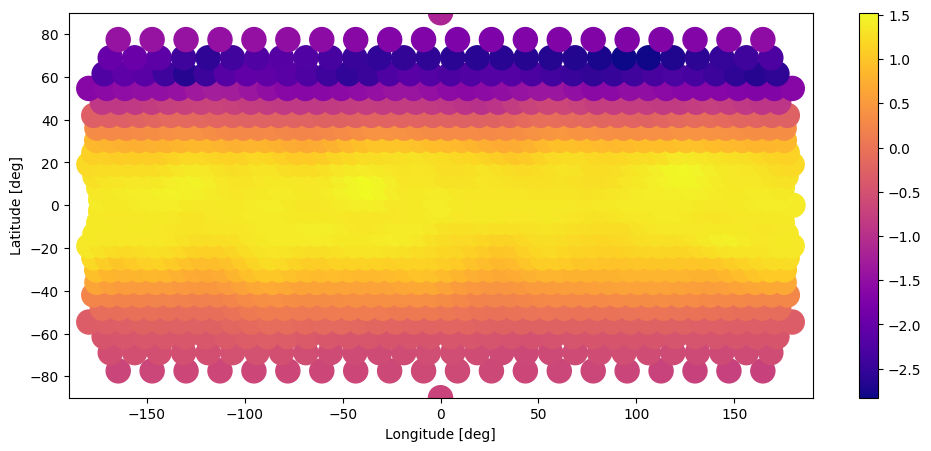

In [180]:
fig, ax = plt.subplots(1, figsize=(12, 5))
im = ax.scatter(lon, lat, s=300, c=z_score, cmap="plasma")
plt.colorbar(im)
ax.set_xlim(-190, 190)
ax.set_ylim(-90, 90)
ax.set_xlabel("Longitude [deg]")
ax.set_ylabel("Latitude [deg]");

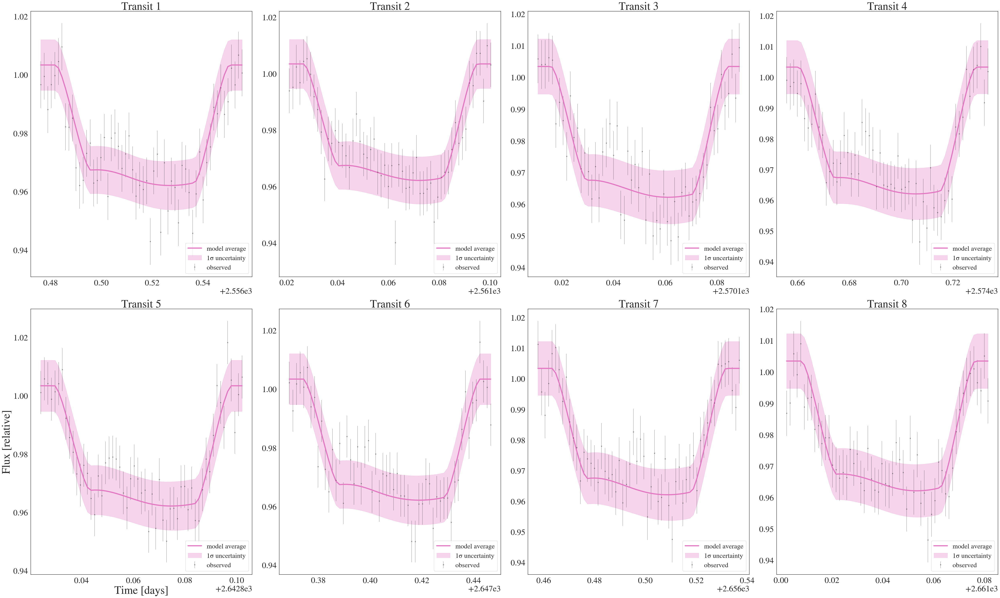

In [488]:
plt.figure(figsize=(50, 30))

transit_count = 0
n = 0

n_samples = 100

flux_samples = np.zeros((len(t), n_samples))

for i in range(n_samples):
    flux_samples[:, i] = ssp.design_matrix.eval() @ ylms[i]

flux_mean = np.mean(flux_samples, axis=1)
flux_std = np.std(flux_samples, axis=1)

while transit_count < 8:
    i = 0
    idx = (total_t > truths['planet.t0']+(i+n)*truths['planet.porb']-0.04) & (total_t < truths['planet.t0']+(i+n)*truths['planet.porb']+0.04)
    
    if np.sum(idx) > 0:
        plt.subplot(2, 4, transit_count+1)
        
        plt.errorbar(total_t[idx], total_flux[idx], yerr=total_sigma[idx], 
                    alpha=0.3, label="observed", color='k', fmt='.')
        
        model_idx = (t > truths['planet.t0']+(i+n)*truths['planet.porb']-0.04) & (t < truths['planet.t0']+(i+n)*truths['planet.porb']+0.04)
        
        plt.plot(t[model_idx], flux_mean[model_idx], "C6", label="model average", alpha=1, lw=4)
        
        plt.fill_between(t[model_idx], 
                        flux_mean[model_idx] - flux_std[model_idx],
                        flux_mean[model_idx] + flux_std[model_idx],
                        color="C6", alpha=0.3, label="1σ uncertainty")
        
        plt.legend(fontsize=24, loc="lower right")
        if transit_count == 4:
            plt.xlabel("Time [days]", fontsize=40)
            plt.ylabel("Flux [relative]", fontsize=40)
        plt.title(f"Transit {transit_count + 1}",fontsize=40)
        plt.tick_params(axis='both', labelsize=30)
        plt.gca().xaxis.offsetText.set_fontsize(30)
        plt.gca().yaxis.offsetText.set_fontsize(30)
        
        transit_count += 1
    
    n += 1
    
    if n > 100:
        print(f"Warning: Only found {transit_count} transits with data after checking 100 periods.")
        break

plt.tight_layout()
# plt.show()
plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-model-transits.pdf", bbox_inches="tight", dpi=300)

In [351]:
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]

In [55]:
custom_labels = {
    'planet_inc': r'$i_p (^\circ)$',
    'ecc': r'$e$',
    'porb': r'$P_{\rm orb} (\rm days)$',
    't0': r'$t_0 (\rm days)$',
    'planet_w': r'$\omega (^\circ)$',
    'star_inc': r'$i_\star (^\circ)$',
    'u1': r'$u_1$',
    'u2': r'$u_2$',
    'prot': r'$P_\star(\rm days)$',
    'star_obl': r'$\lambda_\star (^\circ)$',
    'gp_mu': r'$\mu_\phi (^\circ)$',
    'gp_sigma': r'$\sigma_\phi (^\circ)$',
    'gp_r': r'$\mathbb{r} (^\circ)$',
    'gp_c': r'$\mathbb{c}$',
    'gp_n': r'$\mathbb{n}$',
    'stellar_mass': r'$M_\star$',
    'planet_r': r'$R_p/R_\star$',
    "vsini": r'$v\sin{i} (km s^{-1})$',
    "star_density": r'$\rho_\star (\rm g cm^{-3})$',
}

In [57]:
planets_idx = [0,1,2,3,4,7,8,16]
stars_idx = [5,6,9,18]
gp_idx = [10,11,12,13,14]

In [58]:
labels = np.array(labels)
labels[gp_idx]

array(['gp_r', 'gp_c', 'gp_n', 'gp_mu', 'gp_sigma'], dtype='<U12')

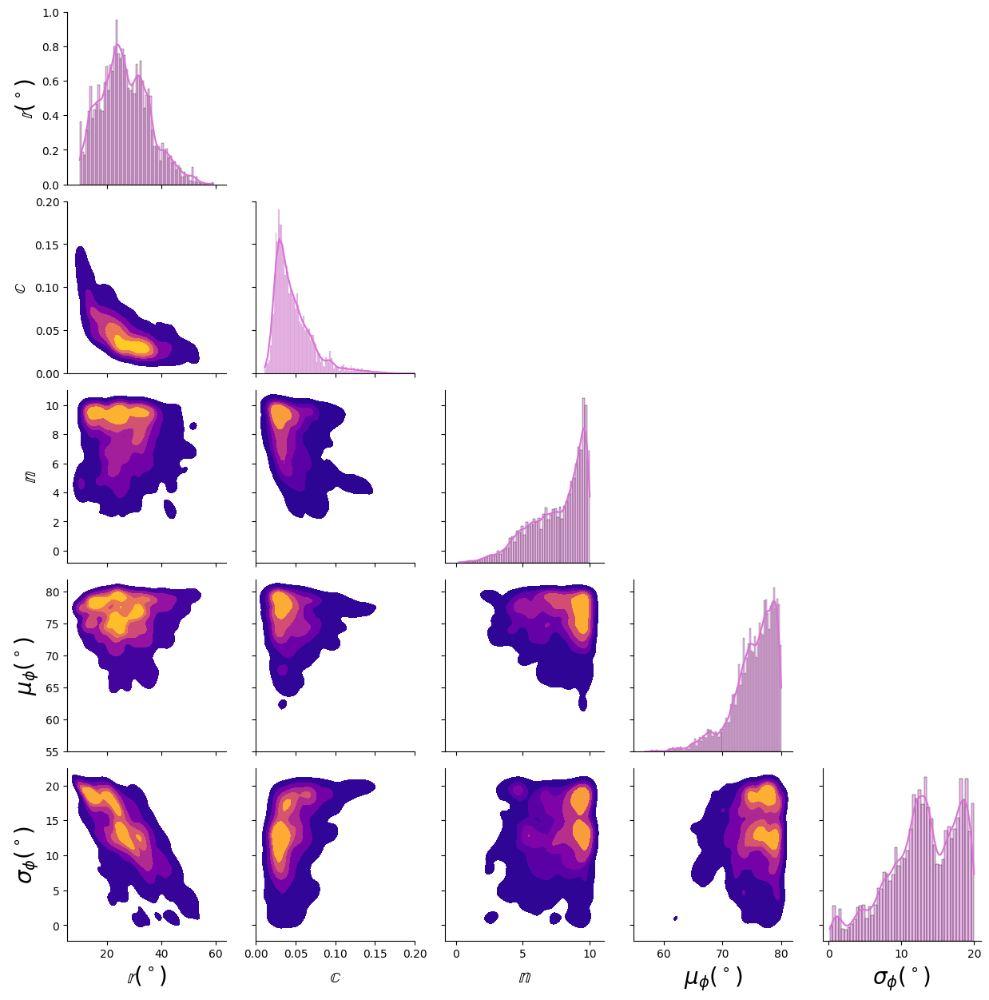

In [59]:
import pandas as pd
import seaborn as sns
# sns.set(style='ticks')
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
labels = np.array(labels)
unpacked_transformed_df = pd.DataFrame(unpacked_transformed[:,:,gp_idx].reshape(1000 * 40, 5))
unpacked_transformed_df.columns = labels[gp_idx]
g = sns.PairGrid(unpacked_transformed_df, diag_sharey=False)

g.map_diag(sns.histplot, kde=True, color='orchid')

g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

g.map_upper(remove_upper)

for i in range(len(labels[gp_idx])):
    # Set y-axis limit for the column of the second parameter
    if i != 1:  # For all rows except the diagonal
        g.axes[i, 1].set_xlim(0, 0.2)
    
    # Set x-axis limit for the row of the second parameter
    if i != 1:  # For all columns except the diagonal
        g.axes[1, i].set_ylim(0, 0.2)

g.axes[1, 1].set_xlim(0, 0.2)

for i, var in enumerate(labels[gp_idx]):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-corner-gps.pdf", bbox_inches="tight", dpi=300)

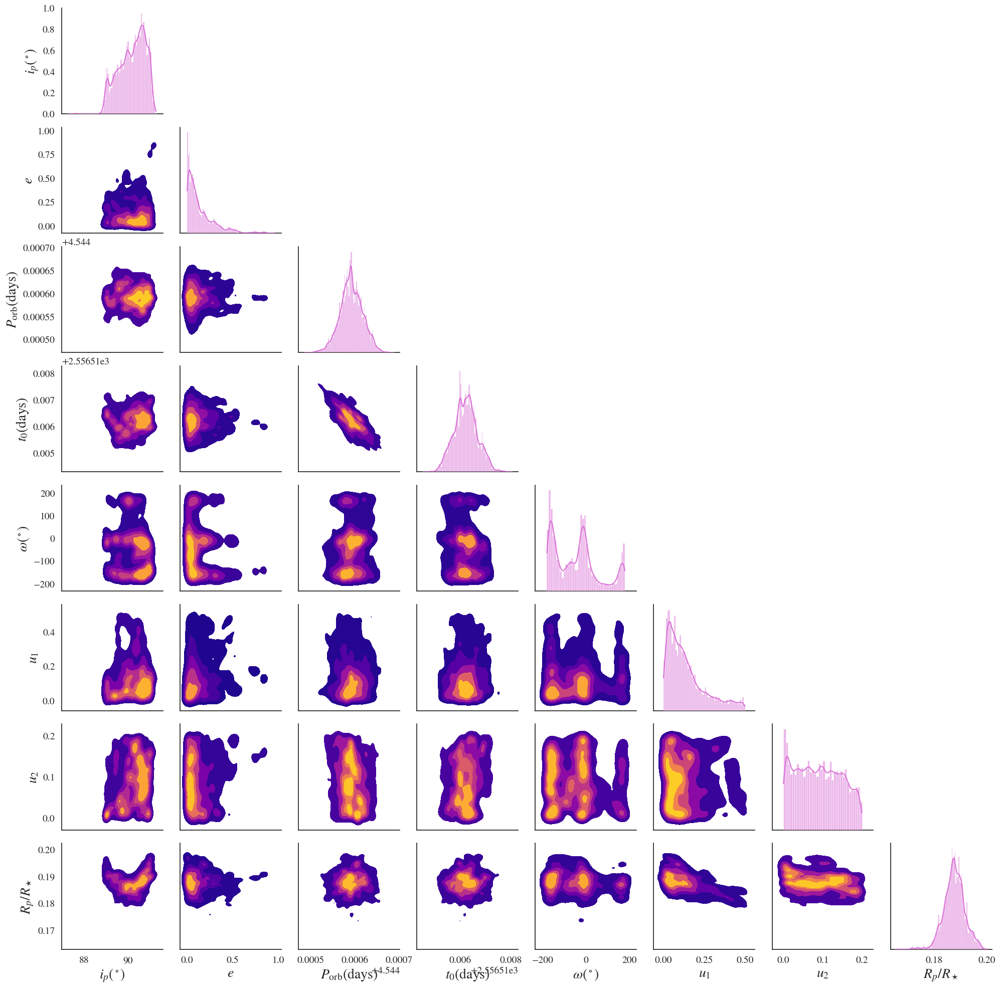

In [483]:
import pandas as pd
import seaborn as sns
# sns.set(style='ticks')
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
labels = np.array(labels)
unpacked_transformed_df = pd.DataFrame(unpacked_transformed[:,:,planets_idx].reshape(1000 * 40, len(planets_idx)))
unpacked_transformed_df.columns = labels[planets_idx]
g = sns.PairGrid(unpacked_transformed_df, diag_sharey=False)

g.map_diag(sns.histplot, kde=True, color='orchid')

g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

g.map_upper(remove_upper)


for i, var in enumerate(labels[planets_idx]):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-corner-planet.pdf", bbox_inches="tight", dpi=300)

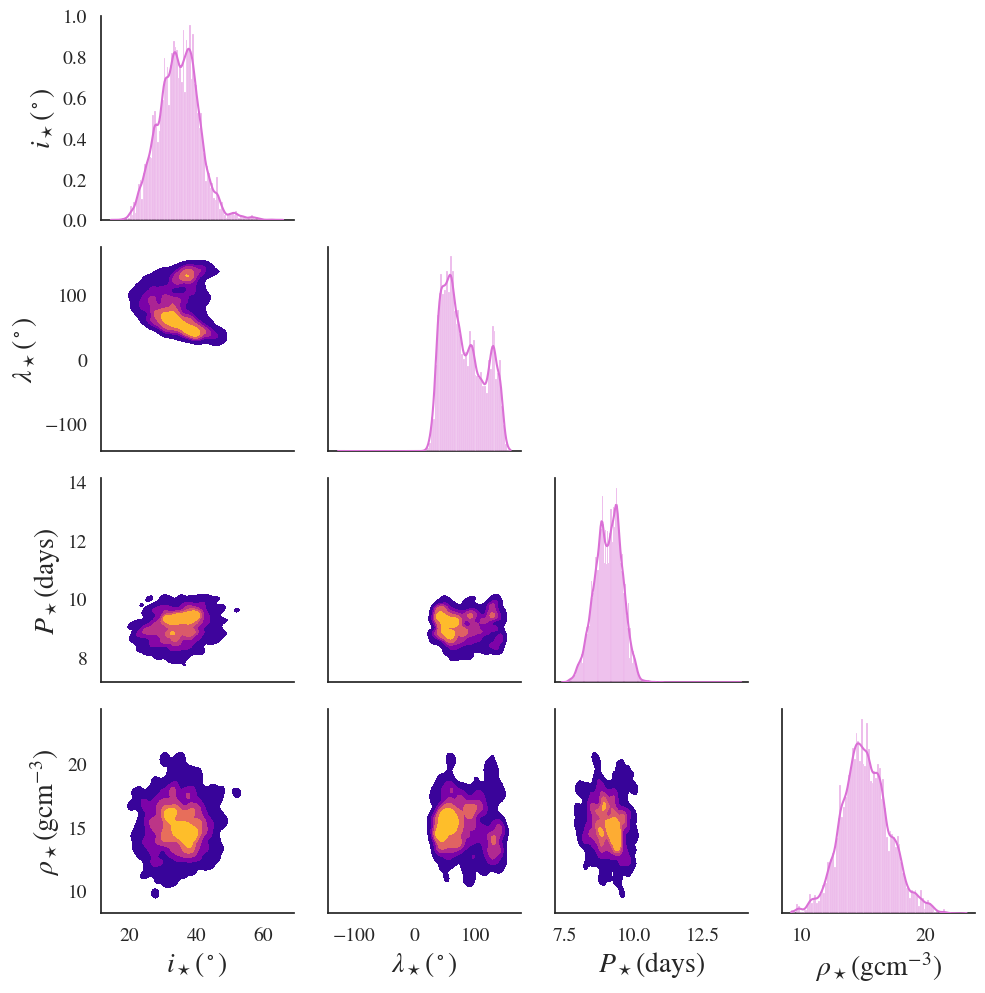

In [482]:
import pandas as pd
import seaborn as sns
# sns.set(style='ticks')
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
labels = np.array(labels)
unpacked_transformed_df = pd.DataFrame(unpacked_transformed[:,:,stars_idx].reshape(1000 * 40, len(stars_idx)))
unpacked_transformed_df.columns = labels[stars_idx]
g = sns.PairGrid(unpacked_transformed_df, diag_sharey=False)

g.map_diag(sns.histplot, kde=True, color='orchid')

g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

g.map_upper(remove_upper)


for i, var in enumerate(labels[stars_idx]):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-corner-star.pdf", bbox_inches="tight", dpi=300)

In [392]:
libby_compare = np.array([0,1,5,6,16,17,18])

In [393]:
planet_inc_lit = 89.81
planet_inc_err = 0.13
e_lit = 0.06
e_err = 0.06
star_inc_lit = 25
star_inc_err = 5
star_obl_lit = 75
star_obl_err = 10
planet_r_lit = 0.197
planet_r_err = 0.002
vsini_lit = 3.59
vsini_err = 0.92
density_lit = 15.26
density_err = 2.04

In [67]:
from matplotlib import rcParams
# Use matplotlib's built-in math rendering instead of LaTeX
rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    "font.size": 14,
    "axes.labelsize": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 12,
    "mathtext.fontset": "stix",  # Use STIX fonts for math (similar to LaTeX)
    "font.serif": ["STIXGeneral", "DejaVu Serif"]
})

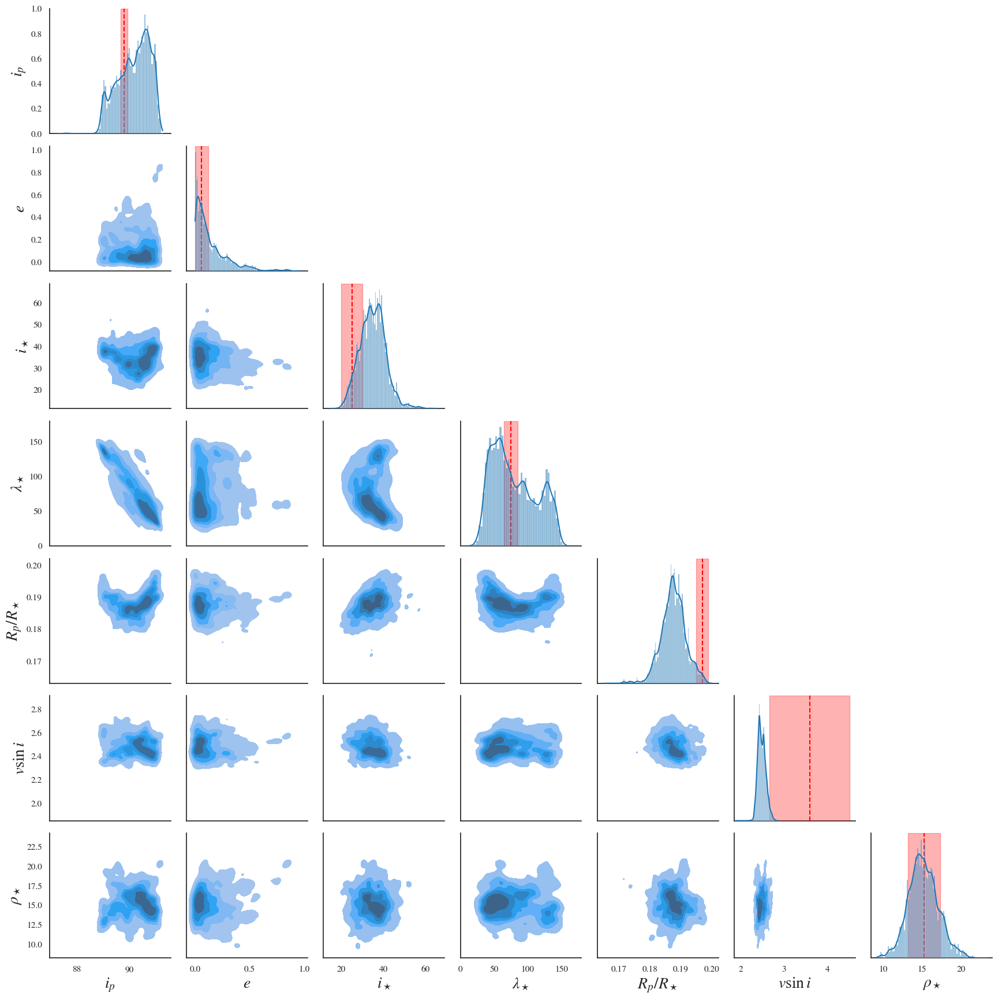

In [ ]:
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r", "vsini", "star_density"]
labels = np.array(labels)

# Use matplotlib's built-in math rendering instead of LaTeX
rcParams.update({
    "font.family": "serif",
    "font.size": 12,  # Slightly smaller font for the expanded plot
    "axes.labelsize": 14,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 10,
    "mathtext.fontset": "stix",  # Use STIX fonts for math (similar to LaTeX)
    "font.serif": ["STIXGeneral", "DejaVu Serif"]
})

# Define parameter names with math notation
param_names = [
    r'$i_p$ (°)',          # planet inclination
    r'$e$',                # eccentricity
    r'$i_\star$ (°)',      # stellar inclination
    r'$\lambda$ (°)',      # stellar obliquity (assuming this is lambda)
    r'$R_p$ ($R_J$)',      # planet radius (in Jupiter radii)
    r'$v\sin{i_\star}$ (km/s)',  # projected rotational velocity
    r'$\rho_\star$ (g/cm³)'  # stellar density
]

# Define literature values and errors
lit_values = {
    r'$i_p$ (°)': (89.81, 0.13),              # (value, error)
    r'$e$': (0.06, 0.06),
    r'$i_\star$ (°)': (25, 5),
    r'$\lambda$ (°)': (75, 10),
    r'$R_p$ ($R_J$)': (0.197, 0.002),
    r'$v\sin{i_\star}$ (km/s)': (3.59, 0.92),
    r'$\rho_\star$ (g/cm³)': (15.26, 2.04)
}

unpacked_transformed_df = pd.DataFrame(unpacked_transformed[:,:,libby_compare].reshape(1000 * 40, len(libby_compare)))
unpacked_transformed_df.columns = labels[libby_compare]
g = sns.PairGrid(unpacked_transformed_df, diag_sharey=False)

def add_lit_line_to_hist(ax, value, error, horizontal=False):
    if horizontal:
        ax.axhspan(value-error, value+error, color='red', alpha=0.3, zorder=1000)
        ax.axhline(value, color='red', linestyle='--', zorder=1001)
    else:
        ax.axvspan(value-error, value+error, color='red', alpha=0.3, zorder=1000)
        ax.axvline(value, color='red', linestyle='--', zorder=1001)

g.map_diag(sns.histplot, kde=True)

g.map_lower(sns.kdeplot, levels=6, fill=True)

def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

g.map_upper(remove_upper)

for i in range(len(labels[gp_idx])):
    # Set y-axis limit for the column of the second parameter
    if i != 3:  # For all rows except the diagonal
        g.axes[i, 3].set_xlim(0, 180)
    
    # Set x-axis limit for the row of the second parameter
    if i != 3:  # For all columns except the diagonal
        g.axes[3, i].set_ylim(0, 180)

g.axes[3, 3].set_xlim(0, 180)

for i, param in enumerate(param_names):
    value, error = lit_values[param]
    add_lit_line_to_hist(g.axes[i, i], value, error)


for i, var in enumerate(labels[libby_compare]):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-libby-compare.pdf", bbox_inches="tight", dpi=300)

In [484]:
for i, var in enumerate(labels):
    samples = unpacked_transformed.reshape(1000*40,19)[:,i]

    median = np.median(samples)
    std = np.std(samples)
    mean = np.mean(samples)

    lower_bound = np.percentile(samples, 16)
    upper_bound = np.percentile(samples, 84)
    
    print(f'{var}: median = {median}, mean = {mean}, std = {std}, 68% credible interval = [{median - lower_bound}, {upper_bound - median}]')


planet_inc: median = 90.26782245046982, mean = 90.1712486195873, std = 0.5913535409654116, 68% credible interval = [0.7820805888266023, 0.5196840521878698]
ecc: median = 0.09060833913134567, mean = 0.14387532977200876, std = 0.15282444678316073, 68% credible interval = [0.07034529242254717, 0.1917782960389198]
porb: median = 4.544591337019953, mean = 4.5445921562035965, std = 2.585080846262997e-05, 68% credible interval = [2.369204645535916e-05, 2.6681236008130327e-05]
t0: median = 2556.516218176334, mean = 2556.5162185836302, std = 0.0004630148046749871, 68% credible interval = [0.0004670185558097728, 0.0004382424172035826]
planet_w: median = -39.42174988762819, mean = -42.96735804121566, std = 104.09965390106892, 68% credible interval = [118.94588580232892, 95.88955805255816]
star_inc: median = 34.80603533017785, mean = 34.844363912599846, std = 6.019777149242974, 68% credible interval = [6.167789333071607, 5.6246037892288285]
star_obl: median = 73.3745759453935, mean = 80.3698965097

In [409]:
labels

array(['planet_inc', 'ecc', 'porb', 't0', 'planet_w', 'star_inc',
       'star_obl', 'u1', 'u2', 'prot', 'gp_r', 'gp_c', 'gp_n', 'gp_mu',
       'gp_sigma', 'stellar_mass', 'planet_r', 'vsini', 'star_density'],
      dtype='<U12')

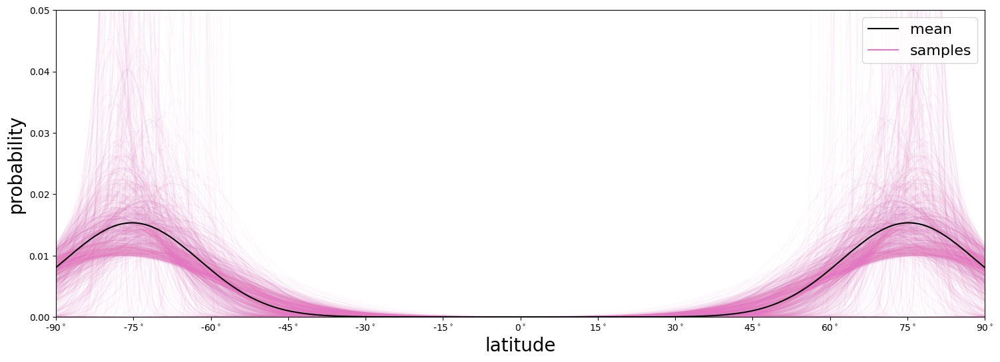

In [54]:
from scipy.stats import norm as Normal

lat=np.linspace(-90., 90., 1000)
nsamples=1000
fig, ax = plt.subplots(1)
fig.set_size_inches(18, 6)
pdf = 0.5 * (
        Normal.pdf(lat, np.mean(unpacked_transformed.reshape(40*1000,19)[:,-6]), np.mean(unpacked_transformed.reshape(40*1000,19)[:,-5]))
        + Normal.pdf(lat, -np.mean(unpacked_transformed.reshape(40*1000,19)[:,-6]),  np.mean(unpacked_transformed.reshape(40*1000,19)[:,-5]))
    )
for k in range(nsamples):
    random_walker = random.randint(0,39)
    ax.plot(lat, 0.5*(Normal.pdf(lat, unpacked_transformed[k,random_walker,-6], unpacked_transformed[k,random_walker,-5])+Normal.pdf(lat, -unpacked_transformed[k,random_walker,-6], unpacked_transformed[k,random_walker,-5])),'C6',lw=1, alpha=0.05, zorder=-1)
ax.plot(lat, pdf,'k',label='mean')
ax.plot(lat, np.nan * lat, "C6-", label="samples")
ax.legend(loc="upper right", fontsize=16)
ax.set_xlim(-90, 90)
ax.set_ylim(0,0.05)
xticks = [-90, -75, -60, -45, -30, -15, 0, 15, 30, 45, 60, 75, 90]
ax.set_xticks(xticks)
ax.set_xticklabels(["{:d}$^\circ$".format(xt) for xt in xticks])
ax.set_xlabel("latitude", fontsize=20)
ax.set_ylabel("probability", fontsize=20)
plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-active-lats.pdf", bbox_inches="tight", dpi=300)

In [ ]:
import random
def plot_sample_maps(chain, moll, traj):
    n_samples = 9
    fig, ax = plt.subplots(3, 3, figsize=(20, 8))
    axes = ax.flatten()

    for i in range(n_samples):
        iternum = random.randint(0,chain.shape[0]-1)
        random_walker = random.randint(0,chain.shape[2]-1)

        map = starry.Map(15, 2)

        b = unpack_parameters(chain[iternum,0,random_walker])[0]
        w_x = unpack_parameters(chain[iternum,0,random_walker])[4]
        w_y = unpack_parameters(chain[iternum,0,random_walker])[5]
        stellar_x_ = unpack_parameters(chain[iternum,0,random_walker])[6]
        stellar_y_ = unpack_parameters(chain[iternum,0,random_walker])[7]
        stellar_z_ = unpack_parameters(chain[iternum,0,random_walker])[8]
        
        planet_w = 180.0/np.pi*np.arctan2(w_y, w_x)
        planet_inc = 180.0/np.pi*np.arccos(b)
        stellar_x, stellar_y, stellar_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
        star_obl = 75#abs(180.0/np.pi*np.arctan2(stellar_y, stellar_x))
        star_inc = (180.0/np.pi*np.arccos(stellar_z / np.sqrt(np.square(stellar_x) + np.square(stellar_y) + np.square(stellar_z))))

        map.inc = star_inc
        map.obl = star_obl
        map[1] = unpack_parameters(chain[iternum,0,random_walker])[9]
        map[2] = unpack_parameters(chain[iternum,0,random_walker])[10]
        star = starry.Primary(map, r=truths["star.r"], m=unpack_parameters(chain[iternum,0,random_walker])[17], prot=unpack_parameters(chain[iternum,0,random_walker])[11]) 
        planet = starry.Secondary(
            starry.Map(0,0),
            inc=planet_inc,
            ecc=unpack_parameters(chain[iternum,0,random_walker])[1],
            Omega=truths["planet.Omega"],
            porb=unpack_parameters(chain[iternum,0,random_walker])[2],
            t0=unpack_parameters(chain[iternum,0,random_walker])[3],
            r=np.exp(unpack_parameters(chain[iternum,0,random_walker])[18]),
            m=truths["planet.m"],
            w=planet_w,
        )

        sys = starry.System(star, planet)
        xo, yo, zo = sys.position(t)
        xo = xo.eval()[1]
        yo = yo.eval()[1]
        zo = zo.eval()[1]
        theta = (360 * t / params["star.prot"]["truth"]) % 360

        # *** Draw 1 sample from the GP
        sp = StarryProcess(
            mu=unpack_parameters(chain[iternum,0,random_walker])[15],
            sigma=unpack_parameters(chain[iternum,0,random_walker])[16],
            r=unpack_parameters(chain[iternum,0,random_walker])[12],
            c=unpack_parameters(chain[iternum,0,random_walker])[13],
            n=unpack_parameters(chain[iternum,0,random_walker])[14],
        )

        # y_sample = sp.sample_ylm().eval().reshape(-1)
        # y_sample[0] += 1

        ssp=StarryStarryProcess(sys,sp)
        ssp.compute(t, flux_obs, sigma_flux)
        y_sample = ssp.sample_ylm_conditional(t, flux_obs, sigma_flux).eval()[0]

        if moll:
            sp.visualize(y_sample, ax=axes[i])

        if traj:
            xo, yo, zo = sys.position(t)
            xo = xo.eval()[1]
            yo = yo.eval()[1]
            zo = zo.eval()[1]
            idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)
            axes[i].plot(xo[idx], yo[idx], "k.", ms=1);
            axes[i].set_aspect(1)
            axes[i].axis("off")
            map[:, :] = y_sample
            map.show(ax=axes[i])
    plt.tight_layout()
    if moll:
        plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-samples-moll.pdf", bbox_inches="tight", dpi=300)
    if traj:
        plt.savefig("/Users/sabina/Desktop/GitHub/polka-dotted-stars-hatp11/src/tex/figures/toi3884-samples-traj.pdf", bbox_inches="tight", dpi=300)

AttributeError: 'NoneType' object has no attribute 'write'

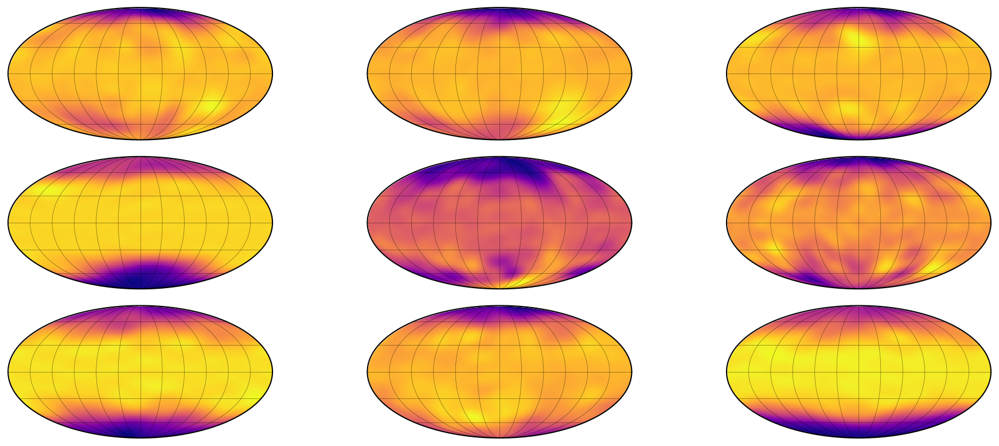

In [491]:
plot_sample_maps(chains,moll=True, traj=False)

AttributeError: 'NoneType' object has no attribute 'write'

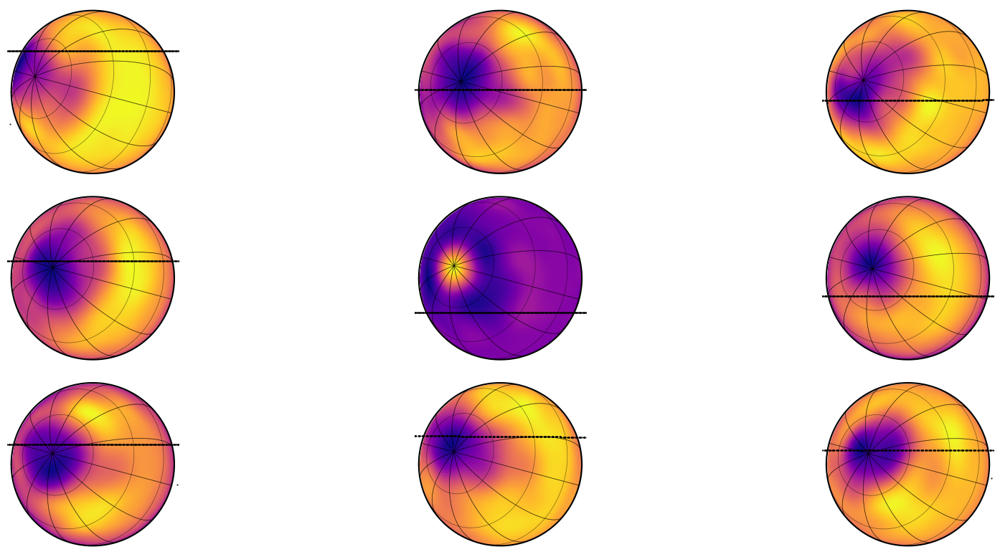

In [492]:
plot_sample_maps(chains,moll=False, traj=True)